In [1]:
import xarray as xr
import hvplot.xarray
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy
from scipy import signal
import holoviews as hv
from xrsignal import xrsignal
import matplotlib

plt.rcParams.update({
    'text.usetex':True,
    'font.family':'serif',
    'font.size':18
})
import pickle

# Compare NCCFs to simulation

In [62]:
fn = '/datadrive/DAS/NCCFs/27000_30000_15-25Hz_dx5_refidx300.nc'
da = xr.open_dataarray(fn)
da = da.assign_coords({'distance':np.arange(-3000,3000, 10), 'delay':np.arange(-14.995, 15, 0.005)})

da_c = xrsignal.hilbert_mag(da, dim='delay')

In [3]:
fn = '/datadrive/simulation/DAS/30000_env.pkl'
with open(fn, 'rb') as f:
    p = pickle.load(f)

In [48]:
b,a = signal.butter(4, [0.15, 0.25], btype='bandpass')
p_filt = signal.filtfilt(b,a,p, axis=0)

p_c = np.abs(signal.hilbert(p_filt, axis=0))

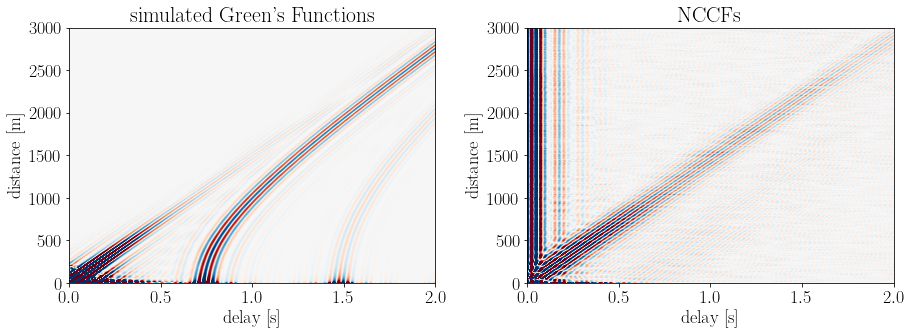

In [114]:
fig, axes = plt.subplots(1,2, figsize=(13,5))
axes = axes.flatten()

# Plot simulation results
plt.sca(axes[0])
plt.imshow(p_filt.T/np.std(p_filt), aspect='auto', extent=(0,30,6000,0), vmax=1, vmin=-1, cmap='RdBu')
plt.xlabel('delay [s]')
plt.title("simulated Green's Functions")
plt.ylabel('distance [m]')
plt.ylim([0,3000])
plt.xlim([0,2])
#plt.colorbar(label='amplitude (normalized to standard deviation)')

#Plot NCCFs
plt.sca(axes[1])
plt.imshow(da/(da.std()), cmap='RdBu', vmax=5, vmin=-5, aspect='auto', extent=(-15,15,3000,-3000))
plt.ylabel('distance [m]')
plt.xlabel('delay [s]')
plt.xlim([0,2])
plt.ylim([0,3000])
plt.title('NCCFs')
#plt.colorbar()
plt.tight_layout()

fig.savefig('figures/NCCF_sim_comparison.png', dpi=300)

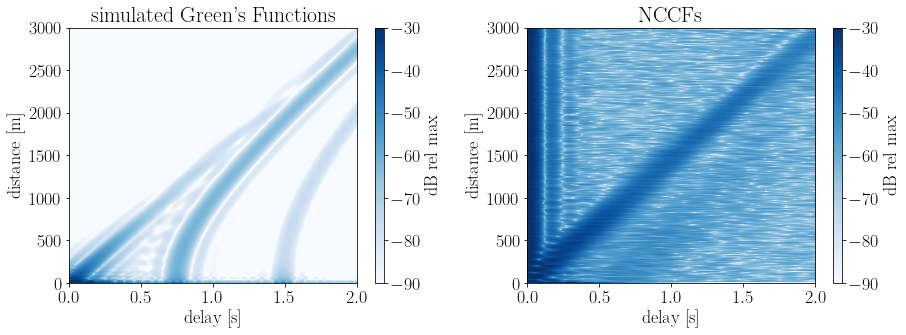

In [115]:
fig, axes = plt.subplots(1,2, figsize=(13,5))
axes = axes.flatten()

# Plot simulation results
plt.sca(axes[0])
plt.imshow(20*np.log10(p_c.T/np.max(p_c)), aspect='auto', extent=(0,30,6000,0), cmap='Blues', vmax=-30, vmin=-90)
plt.xlabel('delay [s]')
plt.title("simulated Green's Functions")
plt.ylabel('distance [m]')
plt.ylim([0,3000])
plt.xlim([0,2])
plt.colorbar(label='dB rel max', aspect=30)

#Plot NCCFs
plt.sca(axes[1])
plt.imshow(20*np.log10(da_c/da_c.max()), cmap='Blues', aspect='auto', extent=(-15,15,3000,-3000), vmax=-30, vmin=-90)
plt.ylabel('distance [m]')
plt.xlabel('delay [s]')
plt.xlim([0,2])
plt.ylim([0,3000])
plt.title('NCCFs')
plt.colorbar(label='dB rel max', aspect=30)

plt.tight_layout()

fig.savefig('figures/NCCF_sim_comparison_c.png', dpi=300)

In [37]:
xrsignal.hilbert_mag(da,dim='delay')

<xarray.DataArray (distance: 600, delay: 5999)>
array([[2.31201679e-08, 6.55196414e-08, 1.15601293e-07, ...,
        9.88008000e-08, 5.34864264e-08, 1.40625556e-08],
       [7.20879301e-08, 1.03730081e-07, 1.50867505e-07, ...,
        1.45240749e-07, 9.84743140e-08, 7.12896448e-08],
       [5.72226853e-08, 7.77118085e-08, 1.15204187e-07, ...,
        1.22033368e-07, 8.43764166e-08, 5.91750853e-08],
       ...,
       [6.01023574e-08, 1.01495879e-07, 1.23528906e-07, ...,
        1.12023422e-07, 9.28312479e-08, 5.61767840e-08],
       [3.07028521e-08, 4.68744240e-08, 6.06646047e-08, ...,
        1.54598068e-08, 1.32977402e-08, 1.79251235e-08],
       [1.99713743e-08, 3.34962889e-08, 4.65011021e-08, ...,
        7.49942708e-08, 5.28244681e-08, 3.05784563e-08]])
Coordinates:
  * distance  (distance) int64 -3000 -2990 -2980 -2970 ... 2960 2970 2980 2990
  * delay     (delay) float64 -14.99 -14.99 -14.98 -14.98 ... 14.99 14.99 15.0

# Look at difference between filtering before and after

In [3]:
fn1 = '/datadrive/DAS/NCCFs/refidx/30000_33000_15-25Hz_dx30_refidx0.nc'
da_15_25 = xr.open_dataarray(fn1)

fn2 = '/datadrive/DAS/NCCFs/30000_33000_1-90Hz.nc'
da_1_90 = xr.open_dataarray(fn2)

In [9]:
b,a = signal.butter(4, [0.15, 0.25], btype='bandpass')
da_1_90_filt = xrsignal.filtfilt(da_1_90, dim='delay', b=b, a=a)

In [12]:
da_15_25.hvplot.image(rasterize=True) + da_1_90_filt.hvplot.image(rasterize=True)

:Layout
   .DynamicMap.I  :DynamicMap   []
      :Image   [delay,distance]   (multi-element NCCF)
   .DynamicMap.II :DynamicMap   []
      :Image   [delay,distance]   (value)

In [15]:
(da_15_25 - da_1_90_filt).hvplot.image(cmap='RdBu', rasterize=True)

:DynamicMap   []
   :Image   [delay,distance]   (value)